# Inspect Data


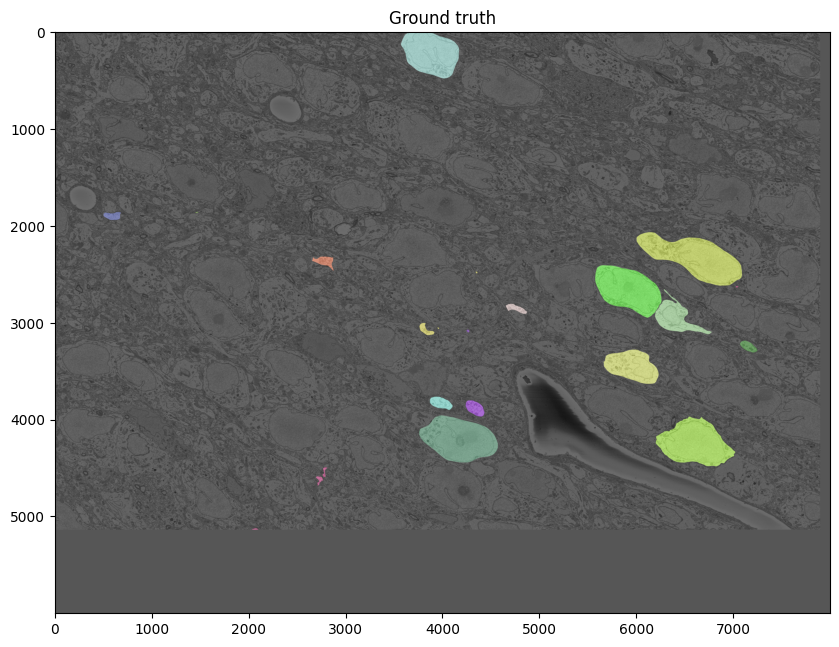

In [3]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

def create_lut(labels):
    labels = labels.astype(np.int64)  # ensure labels are integer
    max_label = np.max(labels)
    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel
    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]
    colored_labels = lut[labels]
    return colored_labels

data = zarr.open('/data/base/3M-APP-SCN/01_data/SCN_DL_12AM_VL.zarr', mode='r')

# Get the offset for labels_sv
offset = data['labels'].attrs['offset']

# Choose a layer within the bounds of labels_sv
layer = 50  # This is relative to the labels_sv volume

# Calculate the corresponding layer in the raw data
raw_layer = layer + offset[0] // data['raw'].attrs['resolution'][0]

# Extract the slices
raw_slice = data['raw'][raw_layer, 
                        offset[1] // data['raw'].attrs['resolution'][1]:offset[1] // data['raw'].attrs['resolution'][1] + data['labels'].shape[1],
                        offset[2] // data['raw'].attrs['resolution'][2]:offset[2] // data['raw'].attrs['resolution'][2] + data['labels'].shape[2]]
labels_slice = data['labels'][layer, :, :]

# Display the slices
fig, axes = plt.subplots(1, 1, figsize=(10, 10), sharex=True, sharey=True, squeeze=False)
axes[0][0].imshow(raw_slice, cmap='gray')
axes[0][0].imshow(create_lut(np.squeeze(labels_slice)), alpha=0.5)
axes[0][0].set_title("Ground truth")
plt.show()

## Create sub-volume

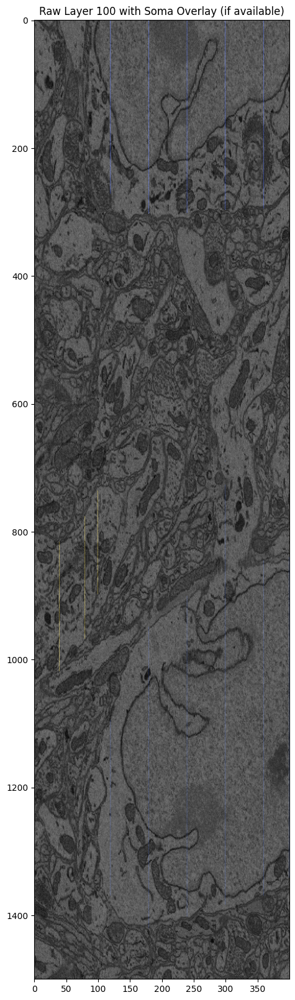

In [6]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

def create_lut(labels):
    labels = labels.astype(np.int64)  # ensure labels are integer
    max_label = np.max(labels)
    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel
    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]
    colored_labels = lut[labels]
    return colored_labels



data = zarr.open('/data/base/3M-APP-SCN/01_data/SCN_DL_12AM_VL.zarr', mode='r')

raw_ds = 'raw'
label_ds = 'labels'

# Get the offset for labels_sv
offset = data[label_ds].attrs['offset']

# Choose a layer within the bounds of the RAW data
raw_layer = 100

# Calculate the corresponding layer in the labels_sv data
labels_layer = raw_layer - offset[0] // data[raw_ds].attrs['resolution'][0]

# Extract the raw slice (entire layer)
raw_slice = data['raw'][raw_layer, :, :]

# Extract the labels slice if it's within bounds
labels_slice = None
if 0 <= labels_layer < data[label_ds].shape[0]:
    labels_slice = data[label_ds][labels_layer, :, :]

# Display the slices
fig, axes = plt.subplots(1, 1, figsize=(20, 20), sharex=True, sharey=True, squeeze=False)
axes[0][0].imshow(raw_slice, cmap='gray')

# Overlay the labels if available
if labels_slice is not None:
    # Calculate the offset in pixels for the overlay
    x_offset = offset[1] // data[raw_ds].attrs['resolution'][1]
    y_offset = offset[2] // data[raw_ds].attrs['resolution'][2]

    # Create an empty array with the same dimensions as the raw slice
    overlay = np.zeros((raw_slice.shape[0], raw_slice.shape[1], 4), dtype=np.uint8)

    # Place the labels into the overlay array at the correct offset
    overlay[y_offset:y_offset + labels_slice.shape[0], x_offset:x_offset + labels_slice.shape[1], :] = create_lut(np.squeeze(labels_slice))

    # Overlay the labels onto the raw slice
    axes[0][0].imshow(overlay, alpha=0.5)

axes[0][0].set_title(f"Raw Layer {raw_layer} with Soma Overlay (if available)")
plt.show()

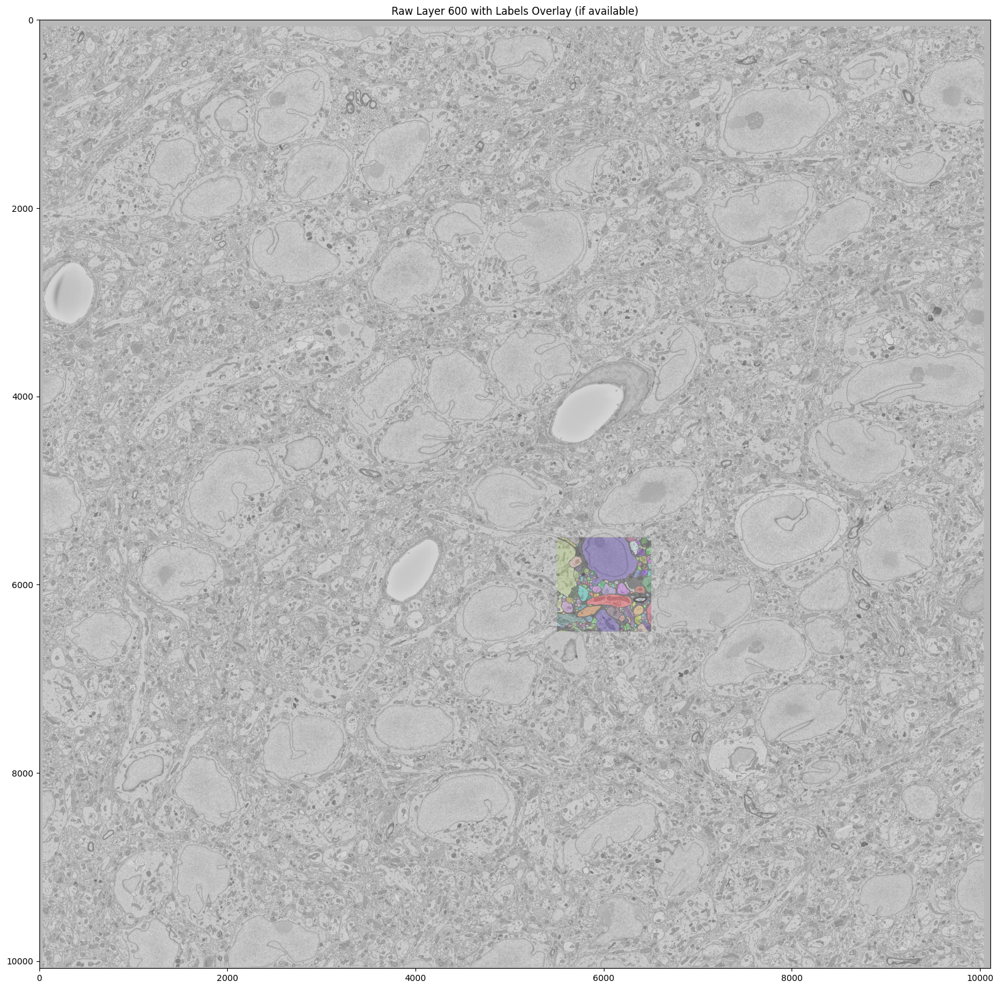

In [13]:

# Display the slices
fig, axes = plt.subplots(1, 1, figsize=(20, 20), sharex=True, sharey=True, squeeze=False)
axes[0][0].imshow(raw_slice, cmap='gray')

# Overlay the labels if available
if labels_slice is not None:
    # Calculate the offset in pixels for the overlay
    x_offset = offset[1] // data['raw'].attrs['resolution'][1]
    y_offset = offset[2] // data['raw'].attrs['resolution'][2]

    # Create an empty array with the same dimensions as the raw slice
    overlay = np.zeros((raw_slice.shape[0], raw_slice.shape[1], 4), dtype=np.uint8)

    # Place the labels into the overlay array at the correct offset
    overlay[y_offset:y_offset + labels_slice.shape[0], x_offset:x_offset + labels_slice.shape[1], :] = create_lut(np.squeeze(labels_slice))

    # Overlay the labels onto the raw slice
    axes[0][0].imshow(overlay, alpha=0.3)

axes[0][0].set_title(f"Raw Layer {raw_layer} with Labels Overlay (if available)")
plt.show()

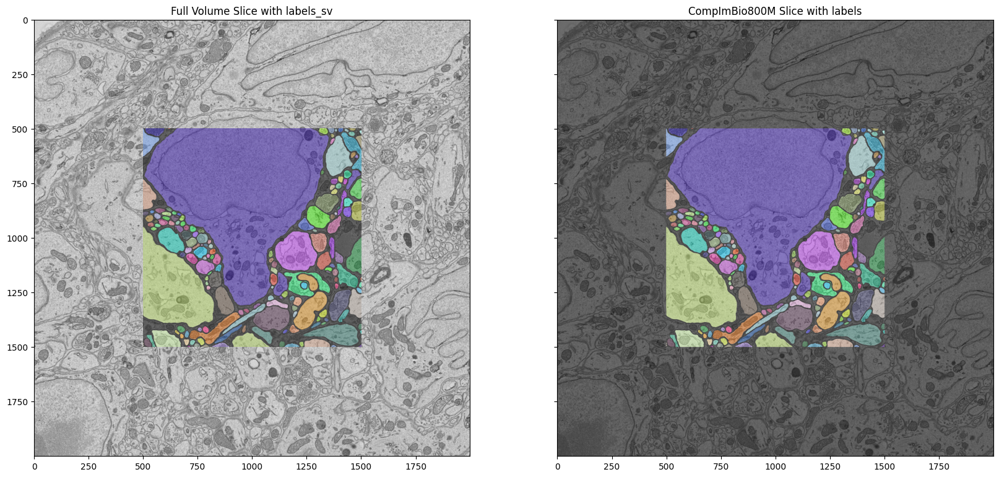

In [1]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

def create_lut(labels):
    labels = labels.astype(np.int64)  # ensure labels are integer
    max_label = np.max(labels)
    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel
    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]
    colored_labels = lut[labels]
    return colored_labels


# Open both Zarr datasets
full_data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-Full.zarr', mode='r')
comp_data = zarr.open('/data/base/3M-APP-SCN/01_data/CompImBio800M.zarr', mode='r')

# Get the offset for labels_sv
labels_sv_offset = full_data['labels_sv'].attrs['offset']

# Calculate the offset for CompImBio800M, considering the extra context
comp_offset = [
    labels_sv_offset[0] - 50 * full_data['raw'].attrs['resolution'][0],  # Adjusted for 50 extra layers
    labels_sv_offset[1] - (comp_data['raw'].shape[1] // 2 - full_data['labels_sv'].shape[1] // 2) * full_data['raw'].attrs['resolution'][1],
    labels_sv_offset[2] - (comp_data['raw'].shape[2] // 2 - full_data['labels_sv'].shape[2] // 2) * full_data['raw'].attrs['resolution'][2]
]

# Choose a layer within the bounds of CompImBio800M
comp_layer = 100

# Calculate the corresponding layer in the full data and labels_sv
full_layer = comp_layer + comp_offset[0] // full_data['raw'].attrs['resolution'][0]
labels_sv_layer = full_layer - labels_sv_offset[0] // full_data['raw'].attrs['resolution'][0]

# Extract the slices
full_slice = full_data['raw'][full_layer, 
                             comp_offset[1] // full_data['raw'].attrs['resolution'][1]:comp_offset[1] // full_data['raw'].attrs['resolution'][1] + comp_data['raw'].shape[1],
                             comp_offset[2] // full_data['raw'].attrs['resolution'][2]:comp_offset[2] // full_data['raw'].attrs['resolution'][2] + comp_data['raw'].shape[2]]
comp_slice = comp_data['raw'][comp_layer, :, :]

# Extract the labels slices if they are within bounds
labels_sv_slice = None
if 0 <= labels_sv_layer < full_data['labels_sv'].shape[0]:
    labels_sv_slice = full_data['labels_sv'][labels_sv_layer, :, :]

comp_labels_slice = comp_data['labels'][comp_layer, :, :]

# Display the slices
fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True, squeeze=False)

# Full Data with labels_sv overlay
axes[0][0].imshow(full_slice, cmap='gray')
if labels_sv_slice is not None:
    # Calculate the offset in pixels for labels_sv
    labels_sv_x_offset = (comp_data['raw'].shape[1] - full_data['labels_sv'].shape[1]) // 2
    labels_sv_y_offset = (comp_data['raw'].shape[2] - full_data['labels_sv'].shape[2]) // 2
    
    # Overlay labels_sv with the correct offset
    axes[0][0].imshow(create_lut(np.squeeze(labels_sv_slice)), alpha=0.5, 
                      extent=[labels_sv_x_offset, labels_sv_x_offset + labels_sv_slice.shape[1], 
                              labels_sv_y_offset + labels_sv_slice.shape[0], labels_sv_y_offset])

axes[0][0].set_title("Full Volume Slice with labels_sv")

# CompImBio800M with labels overlay
axes[0][1].imshow(comp_slice, cmap='gray')
axes[0][1].imshow(create_lut(np.squeeze(comp_labels_slice)), alpha=0.5)
axes[0][1].set_title("CompImBio800M Slice with labels")

plt.show()

In [2]:
# 200, 2000, 2000
2000 * 10

20000

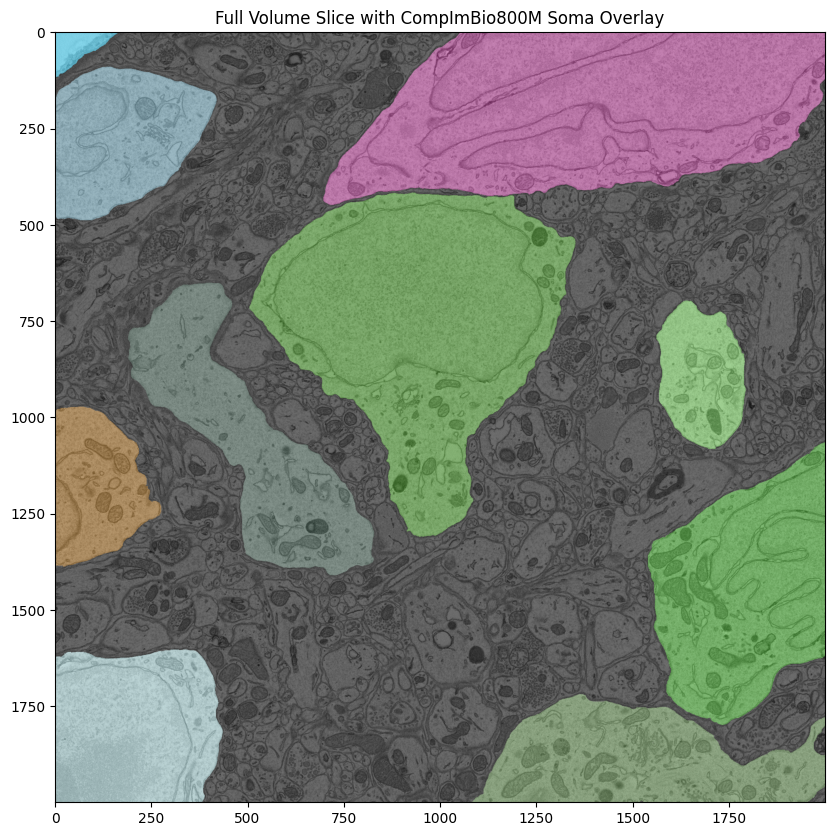

In [21]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

def create_lut(labels):
    labels = labels.astype(np.int64)  # ensure labels are integer
    max_label = np.max(labels)
    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel
    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]
    colored_labels = lut[labels]
    return colored_labels


# Open both Zarr datasets
full_data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-Full.zarr', mode='r')
comp_data = zarr.open('/data/base/3M-APP-SCN/01_data/CompImBio800M.zarr', mode='r')

# Get the offset for labels_sv (used as reference for CompImBio800M)
labels_sv_offset = full_data['labels_sv'].attrs['offset']

# Calculate the offset for CompImBio800M, considering the extra context
comp_offset = [
    labels_sv_offset[0] - 50 * full_data['raw'].attrs['resolution'][0],  # Adjusted for 50 extra layers
    labels_sv_offset[1] - (comp_data['raw'].shape[1] // 2 - full_data['labels_sv'].shape[1] // 2) * full_data['raw'].attrs['resolution'][1],
    labels_sv_offset[2] - (comp_data['raw'].shape[2] // 2 - full_data['labels_sv'].shape[2] // 2) * full_data['raw'].attrs['resolution'][2]
]

# Choose a layer within the bounds of CompImBio800M
comp_layer = 100

# Calculate the corresponding layer in the full data
full_layer = comp_layer + comp_offset[0] // full_data['raw'].attrs['resolution'][0]

# Extract the full data slice
full_slice = full_data['raw'][full_layer, 
                             comp_offset[1] // full_data['raw'].attrs['resolution'][1]:comp_offset[1] // full_data['raw'].attrs['resolution'][1] + comp_data['raw'].shape[1],
                             comp_offset[2] // full_data['raw'].attrs['resolution'][2]:comp_offset[2] // full_data['raw'].attrs['resolution'][2] + comp_data['raw'].shape[2]]

# Extract the soma slice from CompImBio800M
comp_soma_slice = comp_data['soma_ids'][comp_layer, :, :]

# Display the slices
fig, ax = plt.subplots(1, 1, figsize=(10, 10), sharex=True, sharey=True, squeeze=False)

# Full Data with soma overlay
ax[0][0].imshow(full_slice, cmap='gray')
ax[0][0].imshow(create_lut(np.squeeze(comp_soma_slice)), alpha=0.5)
ax[0][0].set_title("Full Volume Slice with CompImBio800M Soma Overlay")

plt.show()

In [7]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

# Open both Zarr datasets
full_data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-Full.zarr', mode='r')
comp_data = zarr.open('/data/base/3M-APP-SCN/01_data/CompImBio800M.zarr', mode='r')

# Get the offset for labels_sv (used as reference for CompImBio800M)
labels_sv_offset = full_data['labels_sv'].attrs['offset']

# Calculate the offset for CompImBio800M, considering the extra context
comp_offset = [
    labels_sv_offset[0] - 50 * full_data['raw'].attrs['resolution'][0],  # Adjusted for 50 extra layers
    labels_sv_offset[1] - (comp_data['raw'].shape[1] // 2 - full_data['labels_sv'].shape[1] // 2) * full_data['raw'].attrs['resolution'][1],
    labels_sv_offset[2] - (comp_data['raw'].shape[2] // 2 - full_data['labels_sv'].shape[2] // 2) * full_data['raw'].attrs['resolution'][2]
]

# Print the calculated offset for the 'soma' dataset
print("Calculated offset for 'soma' dataset:", comp_offset)

# # You can now add this offset to the .zattrs file of the 'soma' dataset
# # (assuming you have write access to the Zarr file)
# comp_data['soma'].attrs['offset'] = comp_offset

# print("Offset added to 'soma' dataset's .zattrs file.")

Calculated offset for 'soma' dataset: [27500, 50000, 50000]


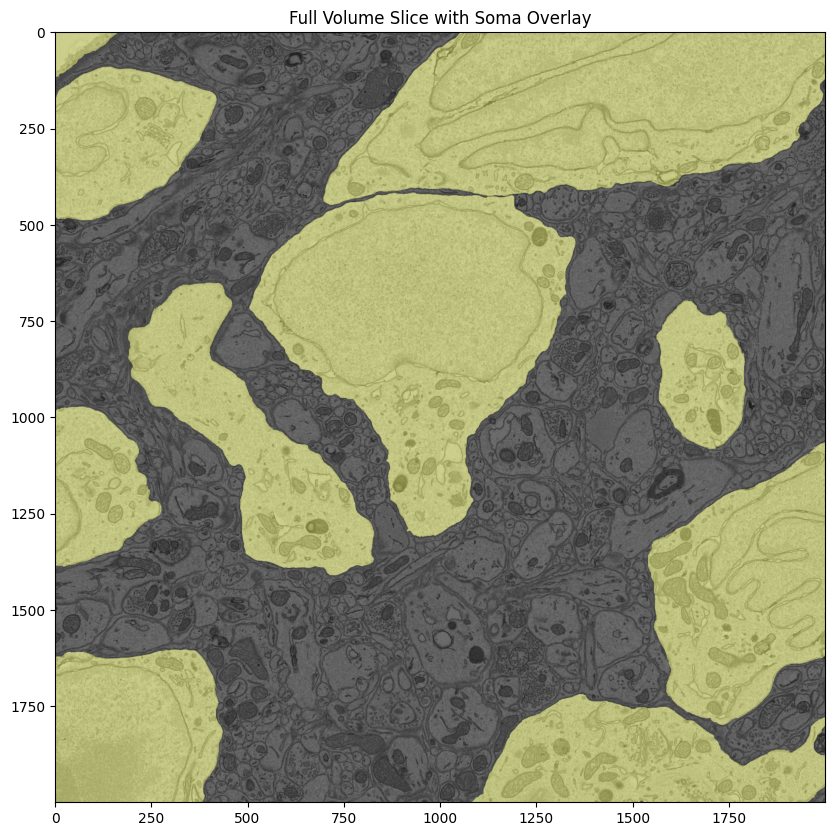

In [22]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 

def create_lut(labels):
    labels = labels.astype(np.int64)  # ensure labels are integer
    max_label = np.max(labels)
    lut = np.zeros((int(max_label + 1), 4), dtype=np.uint8)
    lut[:, 3] = 255  # alpha channel
    for label in range(1, int(max_label + 1)):
        # Generate a deterministic RGB color based on label
        md5 = hashlib.md5()
        md5.update(str(label).encode('utf-8'))
        color_hash = md5.hexdigest()
        lut[label, :3] = [int(color_hash[i:i+2], 16) for i in (0, 2, 4)]
    colored_labels = lut[labels]
    return colored_labels


# Open the Zarr dataset
data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-Full.zarr', mode='r')

# Get the offset for the soma dataset
soma_offset = data['soma'].attrs['offset']

# Choose a layer within the bounds of the soma dataset
soma_layer = 100

# Calculate the corresponding layer in the raw data
raw_layer = soma_layer + soma_offset[0] // data['raw'].attrs['resolution'][0]

# Extract the slices
raw_slice = data['raw'][raw_layer, 
                        soma_offset[1] // data['raw'].attrs['resolution'][1]:soma_offset[1] // data['raw'].attrs['resolution'][1] + data['soma'].shape[1],
                        soma_offset[2] // data['raw'].attrs['resolution'][2]:soma_offset[2] // data['raw'].attrs['resolution'][2] + data['soma'].shape[2]]
soma_slice = data['soma'][soma_layer, :, :]

# Display the slices
fig, ax = plt.subplots(1, 1, figsize=(10, 10), sharex=True, sharey=True, squeeze=False)

# Full Data with soma overlay
ax[0][0].imshow(raw_slice, cmap='gray')
ax[0][0].imshow(create_lut(np.squeeze(soma_slice)), alpha=0.5)
ax[0][0].set_title("Full Volume Slice with Soma Overlay")

plt.show()

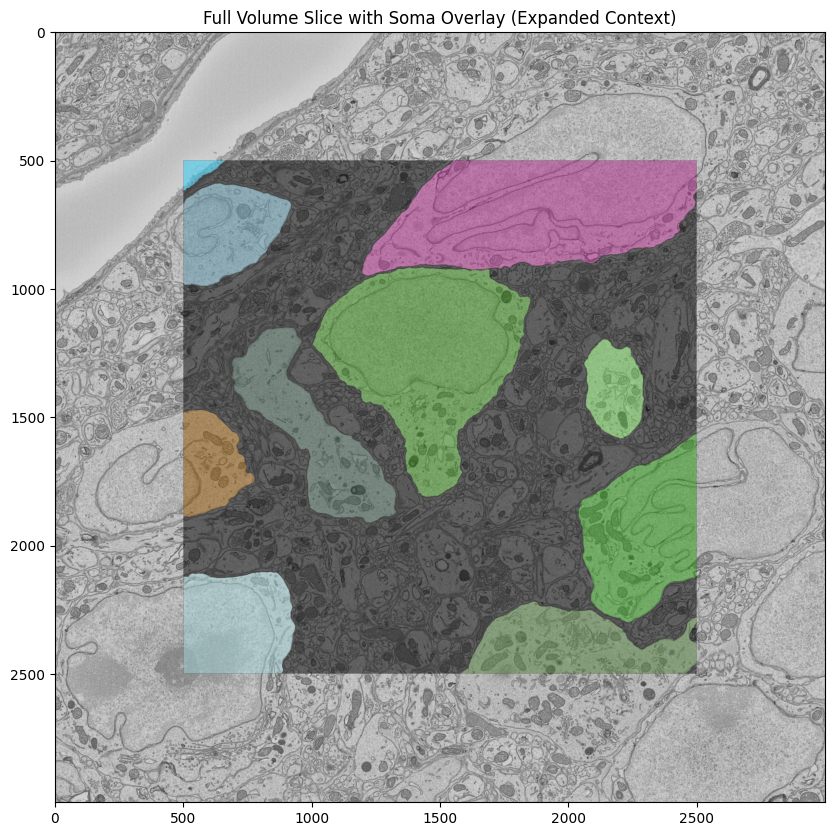

In [23]:
import zarr
import os
import numpy as np
import hashlib
import matplotlib.pyplot as plt 


# Open the Zarr dataset
data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-Full.zarr', mode='r')

# Get the offset for the soma dataset
soma_offset = data['soma'].attrs['offset']

# Choose a layer within the bounds of the soma dataset
soma_layer = 100

# Calculate the corresponding layer in the raw data
raw_layer = soma_layer + soma_offset[0] // data['raw'].attrs['resolution'][0]

# Calculate start and end coordinates for the expanded raw slice
context = 500  # Pixels of context on each side
start_y = soma_offset[1] // data['raw'].attrs['resolution'][1] - context
end_y = soma_offset[1] // data['raw'].attrs['resolution'][1] + data['soma'].shape[1] + context
start_x = soma_offset[2] // data['raw'].attrs['resolution'][2] - context
end_x = soma_offset[2] // data['raw'].attrs['resolution'][2] + data['soma'].shape[2] + context

# Ensure coordinates are within bounds of the raw data
start_y = max(0, start_y)
end_y = min(data['raw'].shape[1], end_y)
start_x = max(0, start_x)
end_x = min(data['raw'].shape[2], end_x)

# Extract the slices
raw_slice = data['raw'][raw_layer, start_y:end_y, start_x:end_x]
soma_slice = data['soma'][soma_layer, :, :]

# Create a blank image for the overlay with the same size as the raw_slice
overlay = np.zeros((raw_slice.shape[0], raw_slice.shape[1], 4), dtype=np.uint8)

# Calculate the offset for placing the soma_slice within the overlay
overlay_y_offset = context
overlay_x_offset = context

# Place the colored soma slice into the overlay
overlay[overlay_y_offset:overlay_y_offset + soma_slice.shape[0], 
        overlay_x_offset:overlay_x_offset + soma_slice.shape[1], :] = create_lut(np.squeeze(soma_slice))

# Display the slices
fig, ax = plt.subplots(1, 1, figsize=(10, 10), sharex=True, sharey=True, squeeze=False)

# Full Data with soma overlay
ax[0][0].imshow(raw_slice, cmap='gray')
ax[0][0].imshow(overlay, alpha=0.5)
ax[0][0].set_title("Full Volume Slice with Soma Overlay (Expanded Context)")

plt.show()

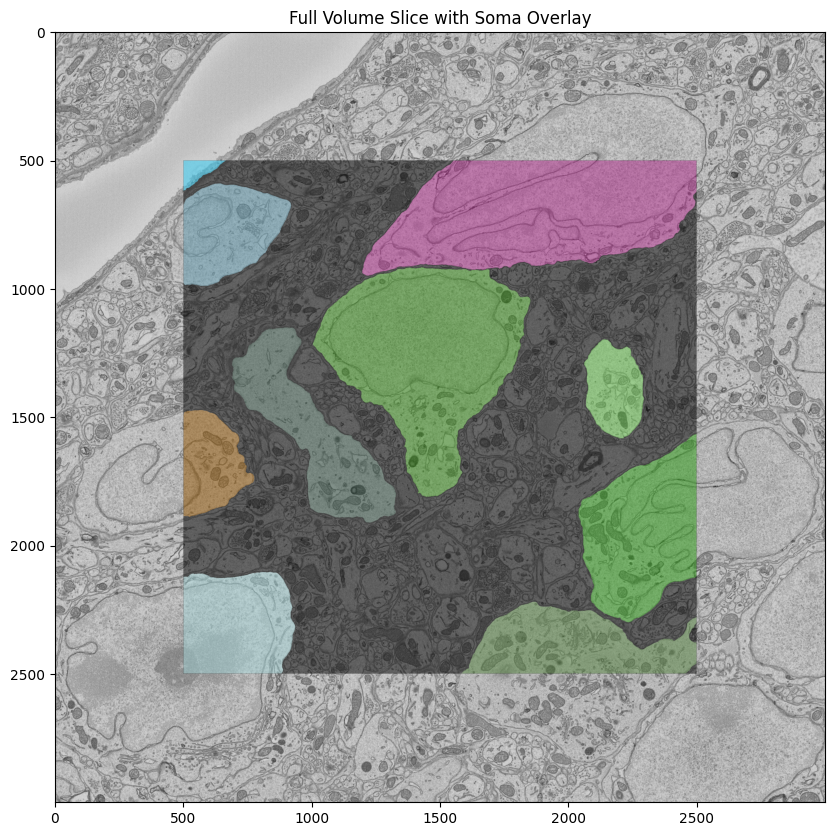

In [24]:
# Open the Zarr dataset
data = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-3000.zarr', mode='r')

# Get the offsets and resolutions
raw_offset = data['raw'].attrs['offset']
soma_offset = data['soma'].attrs['offset']
raw_resolution = data['raw'].attrs['resolution']
soma_resolution = data['soma'].attrs['resolution']

# Choose a layer within the bounds of the soma dataset
soma_layer = 100  # Adjust as needed

# Calculate the corresponding layer in the raw data
raw_layer = soma_layer + (soma_offset[0] - raw_offset[0]) // raw_resolution[0]

# Extract the entire raw slice
raw_slice = data['raw'][raw_layer, :, :]

# Extract the soma slice
soma_slice = data['soma'][soma_layer, :, :]

# Calculate the offset in pixels for the soma overlay
soma_x_offset = (soma_offset[2] - raw_offset[2]) // raw_resolution[2]
soma_y_offset = (soma_offset[1] - raw_offset[1]) // raw_resolution[1]

# Create a blank image for the overlay with the same size as the raw_slice
overlay = np.zeros((raw_slice.shape[0], raw_slice.shape[1], 4), dtype=np.uint8)

# Place the colored soma slice into the overlay at the correct offset
overlay[soma_y_offset:soma_y_offset + soma_slice.shape[0],
        soma_x_offset:soma_x_offset + soma_slice.shape[1], :] = create_lut(np.squeeze(soma_slice))

# Display the slices
fig, ax = plt.subplots(1, 1, figsize=(10, 10), sharex=True, sharey=True, squeeze=False)

# Full Data with soma overlay
ax[0][0].imshow(raw_slice, cmap='gray')
ax[0][0].imshow(overlay, alpha=0.5)
ax[0][0].set_title("Full Volume Slice with Soma Overlay")

plt.show()

In [20]:
import zarr

# Open the zarr file
z = zarr.open('/data/base/3M-APP-SCN/01_data/APP-3M-SCN-3000.zarr', mode='a')

# Access the 'soma' dataset
soma = z['soma']

# Create a new dataset called 'soma_mask' with the same shape and dtype
soma_mask = z.create_dataset('soma_mask', shape=soma.shape, dtype=soma.dtype, chunks=soma.chunks)

# Perform the inversion
soma_mask[:] = (soma[:] == 0).astype(soma.dtype)

AttributeError: 

## Proceed to Prediction Pipeline

The prediction scripts are located in: 

/data/base/3M-APP-SCN/02_train/setup04/

A useful notebook for processing the pipeline can be found at /data/base/3M-APP-SCN/02_train/setup04/prediction_pipeline.ipynb

